In [1]:
import pandas as pd

import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
data = pd.read_csv('cleanedData/data.csv')
data

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,TOTALAREA,CELLPHONE_ACCESS,CNT_DOCUMENTS,AMT_CREDIT_SUM,CNT_PAYMENT,CREDIT_DURATION,AMT_ANNUITY_y,AMT_CREDIT_y,NAME_CONTRACT_STATUS,NAME_CLIENT_TYPE
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0.094100,3,1,59293.652143,24.000000,19.353584,9251.775000,179055.00,Approved,New
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0.128167,3,1,69133.500000,10.000000,8.677472,56553.990000,484191.00,Approved,Refreshed
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0.200733,3,0,94518.900000,4.000000,3.753045,5357.250000,20106.00,Approved,New
3,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0.200733,2,1,146250.000000,20.666667,12.644075,12278.805000,166638.75,Approved,Repeater
4,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,...,0.200733,3,1,100419.750000,14.000000,10.726940,15839.696250,162767.70,Approved,Repeater
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201018,456246,0,Cash loans,F,N,Y,1,94500.0,225000.0,10620.0,...,0.200733,2,1,127500.000000,3.000000,12.452183,6748.830000,84046.50,Approved,New
201019,456247,0,Cash loans,F,N,Y,0,112500.0,345510.0,17770.5,...,0.200733,2,1,119224.800000,7.750000,6.369956,10466.921250,59184.00,Approved,Repeater
201020,456249,0,Cash loans,F,N,Y,0,112500.0,225000.0,22050.0,...,0.496233,2,1,141979.808571,12.000000,9.671877,17133.952500,158699.25,Refused,Repeater
201021,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0.132700,2,1,45000.000000,15.000000,11.160244,10681.132500,134439.75,Approved,Repeater


In [3]:
px.pie(data,names='TARGET')

<AxesSubplot:>

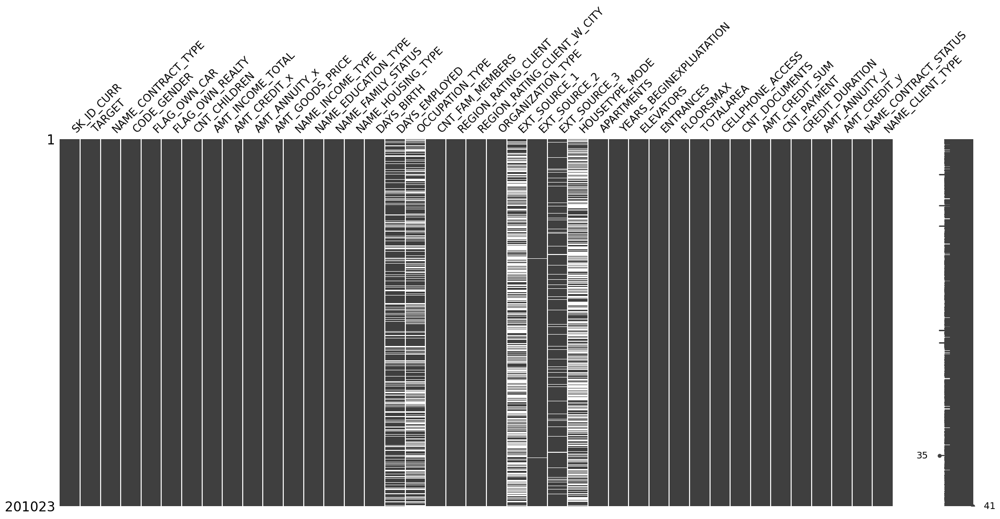

In [4]:
msno.matrix(data)

<AxesSubplot:>

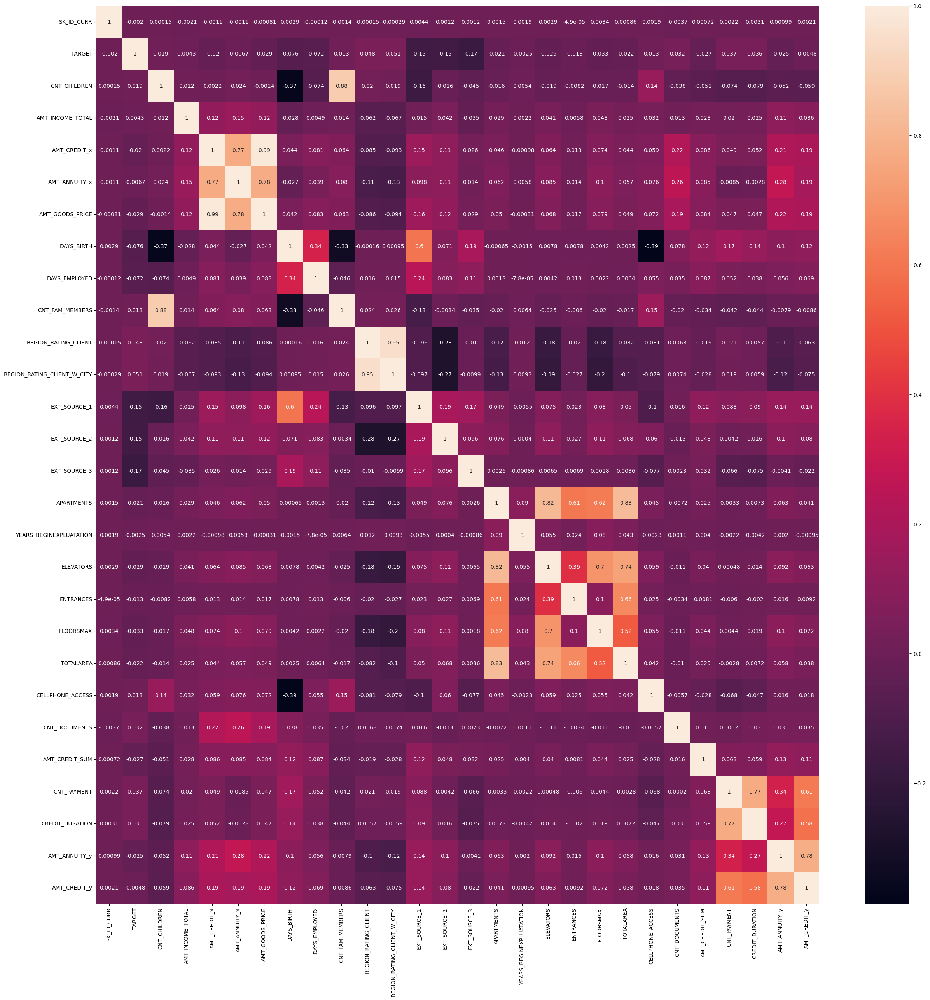

In [5]:
plt.figure(figsize=(30, 30))
sns.heatmap(data.corr(), annot=True)

<Figure size 1200x800 with 0 Axes>

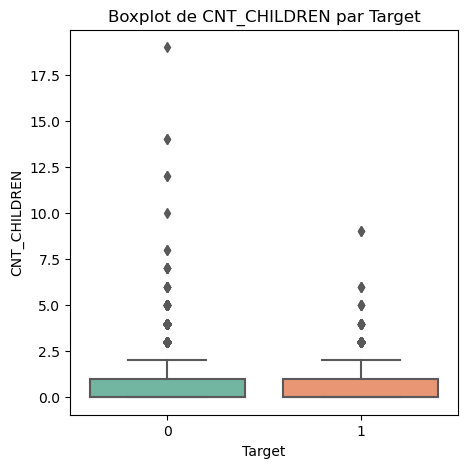

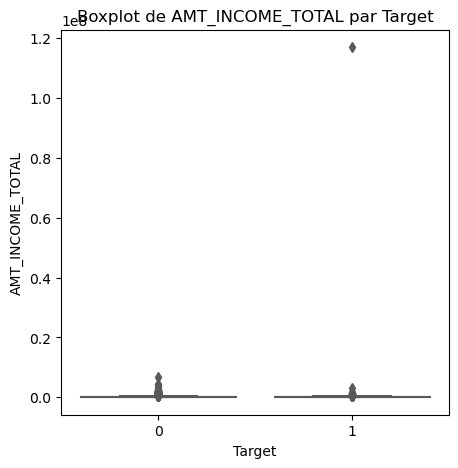

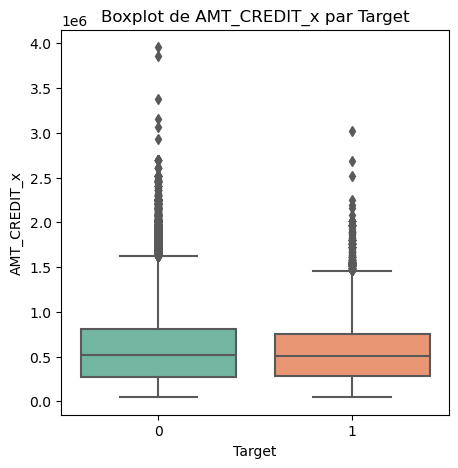

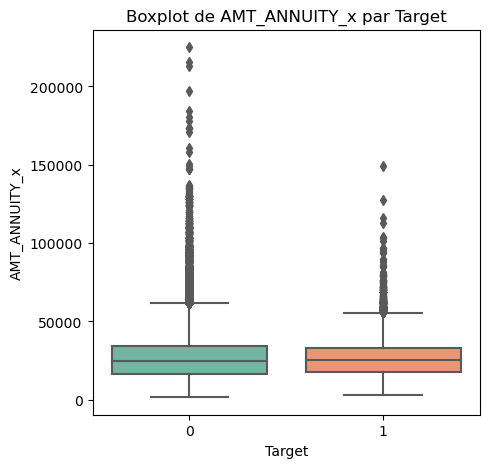

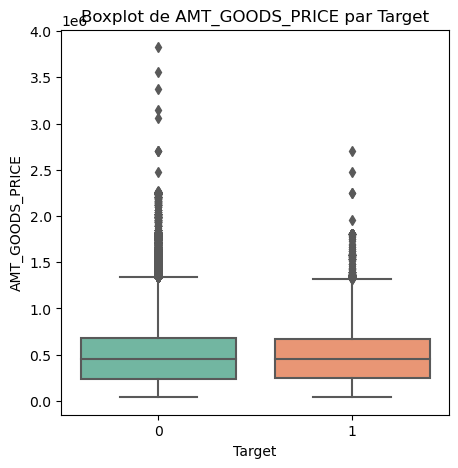

...

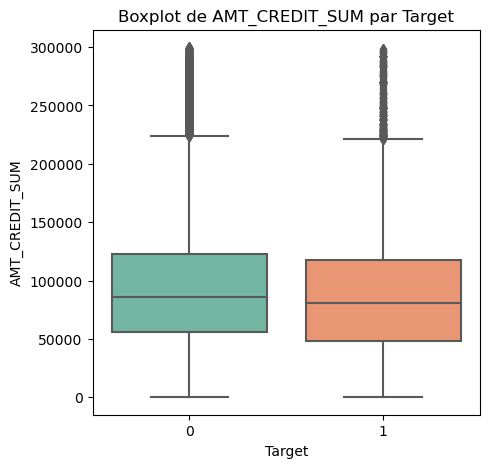

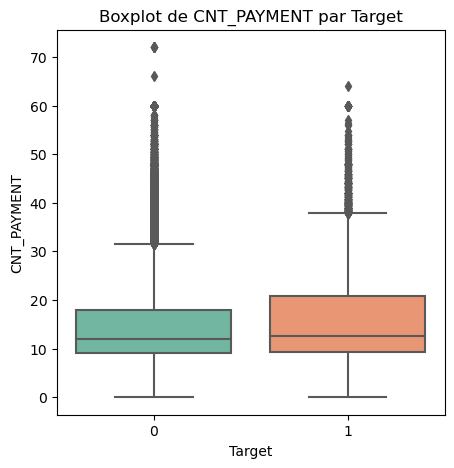

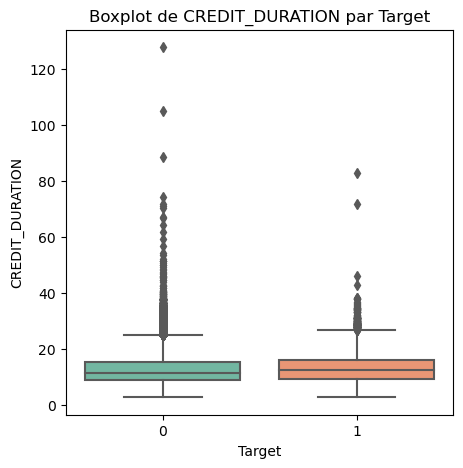

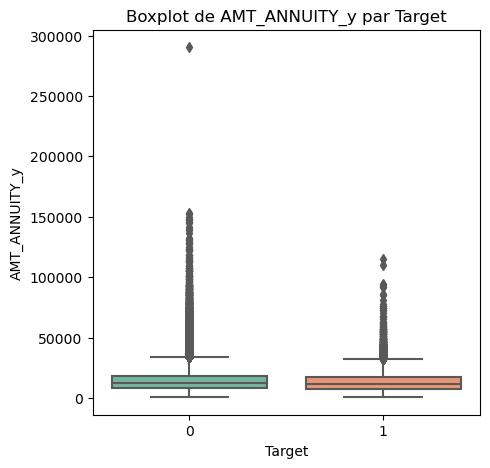

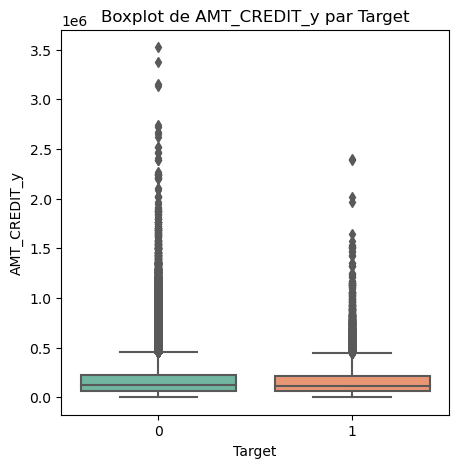

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Liste des colonnes numériques dans vos données
numeric_cols = ['CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT_x',
 'AMT_ANNUITY_x',
 'AMT_GOODS_PRICE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS',
 'YEARS_BEGINEXPLUATATION',
 'ELEVATORS',
 'ENTRANCES',
 'FLOORSMAX',
 'TOTALAREA',
 'CELLPHONE_ACCESS',
 'CNT_DOCUMENTS',
 'AMT_CREDIT_SUM',
 'CNT_PAYMENT',
 'CREDIT_DURATION',
 'AMT_ANNUITY_y',
 'AMT_CREDIT_y']
# Définir la taille de la figure
plt.figure(figsize=(12, 8))

# Parcourir chaque colonne numérique et tracer un boxplot
for col in numeric_cols:
    plt.figure(figsize=(5,5))
    sns.boxplot(x='TARGET', y=col, data=data, palette='Set2')
    plt.title(f'Boxplot de {col} par Target')
    plt.xlabel('Target')
    plt.ylabel(col)
    plt.show()


#### Compte tenu de l'importance de certainezs features sur la target, et, au vu de leur nombre important de données manquantes il incombe de faire une imputations specifique, notamment pour EXT_SOURCE_1 2 et 3 et days_employed et verification du du mode pour les variables categorielles occ type house mode

In [7]:
data_0 = data[data['TARGET']==0]
data_1 = data[data['TARGET']==1]

# valeurs d'imputations pour la class 0 et 1 des exteranl sources
print(data_0['EXT_SOURCE_1'].median())
print(data_1['EXT_SOURCE_1'].median())
print(data_0['EXT_SOURCE_2'].median())
print(data_1['EXT_SOURCE_2'].median())
print(data_0['EXT_SOURCE_3'].median())
print(data_1['EXT_SOURCE_3'].median())
print(data_0['DAYS_EMPLOYED'].median())
print(data_1['DAYS_EMPLOYED'].median())

# donnée categorielles
print(data_0['OCCUPATION_TYPE'].mode())

0.5294506710820102
0.3806574740846509
0.5752677231815019
0.4497779666513706
0.5549467685334323
0.3962195720630885
5.065753424657534
3.731506849315069
0    Laborers
Name: OCCUPATION_TYPE, dtype: object


In [8]:
# px.histogram(data,x='OCCUPATION_TYPE',color='TARGET',barmode='group')
# ce qui justifie l'imputation des nan dans occupation_type

In [9]:
# Imputer les valeurs manquantes dans les colonnes EXT_SOURCE_1, EXT_SOURCE_2 et EXT_SOURCE_3
data.loc[data['TARGET'] == 0, 'EXT_SOURCE_1'] = data.loc[data['TARGET'] == 0, 'EXT_SOURCE_1'].fillna(0.5294506710820102)
data.loc[data['TARGET'] == 1, 'EXT_SOURCE_1'] = data.loc[data['TARGET'] == 1, 'EXT_SOURCE_1'].fillna(0.3806574740846509)

data.loc[data['TARGET'] == 0, 'EXT_SOURCE_2'] = data.loc[data['TARGET'] == 0, 'EXT_SOURCE_2'].fillna(0.5752677231815019)
data.loc[data['TARGET'] == 1, 'EXT_SOURCE_2'] = data.loc[data['TARGET'] == 1, 'EXT_SOURCE_2'].fillna(0.4497779666513706)

data.loc[data['TARGET'] == 0, 'EXT_SOURCE_3'] = data.loc[data['TARGET'] == 0, 'EXT_SOURCE_3'].fillna(0.5549467685334323)
data.loc[data['TARGET'] == 1, 'EXT_SOURCE_3'] = data.loc[data['TARGET'] == 1, 'EXT_SOURCE_3'].fillna(0.3962195720630885)

data.loc[data['TARGET'] == 0, 'EXT_SOURCE_3'] = data.loc[data['TARGET'] == 0, 'EXT_SOURCE_3'].fillna(0.5549467685334323)
data.loc[data['TARGET'] == 1, 'EXT_SOURCE_3'] = data.loc[data['TARGET'] == 1, 'EXT_SOURCE_3'].fillna(0.3962195720630885)

data.loc[data['TARGET'] == 0, 'DAYS_EMPLOYED'] = data.loc[data['TARGET'] == 0, 'DAYS_EMPLOYED'].fillna(5.065753424657534)
data.loc[data['TARGET'] == 1, 'DAYS_EMPLOYED'] = data.loc[data['TARGET'] == 1, 'DAYS_EMPLOYED'].fillna(3.731506849315069)

data.loc[data['TARGET'] == 0, 'OCCUPATION_TYPE'] = data.loc[data['TARGET'] == 0, 'OCCUPATION_TYPE'].fillna('Laborers')
data.loc[data['TARGET'] == 1, 'OCCUPATION_TYPE'] = data.loc[data['TARGET'] == 1, 'OCCUPATION_TYPE'].fillna('Laborers')

#### taux d'occupation d'un individu (annee travailles par age)

In [10]:
data['OCCUPATION_RATE'] = data['DAYS_EMPLOYED']/data['DAYS_BIRTH']

In [11]:
data['RATING_CLIENT_REGION'] = (data['REGION_RATING_CLIENT']+data['REGION_RATING_CLIENT_W_CITY'])/2

In [12]:
# px.histogram(data,x=['REGION_RATING_CLIENT'],color='TARGET', barmode='group')
# px.histogram(data,x=['REGION_RATING_CLIENT_W_CITY'],color='TARGET', barmode='group')

# tres formtement correlés et les graph se resemblent beaucoup

In [13]:
# px.histogram(data,x='HOUSETYPE_MODE',color='TARGET',barmode='group')
# quasi qu'une class avec les meme proportion et aucun incidence sur la target
# ce qui me permet de justifier la sippression d'une colonne

In [14]:
cols_to_drop = ['REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY','HOUSETYPE_MODE']

data.drop(cols_to_drop,axis=1,inplace=True)

<AxesSubplot:>

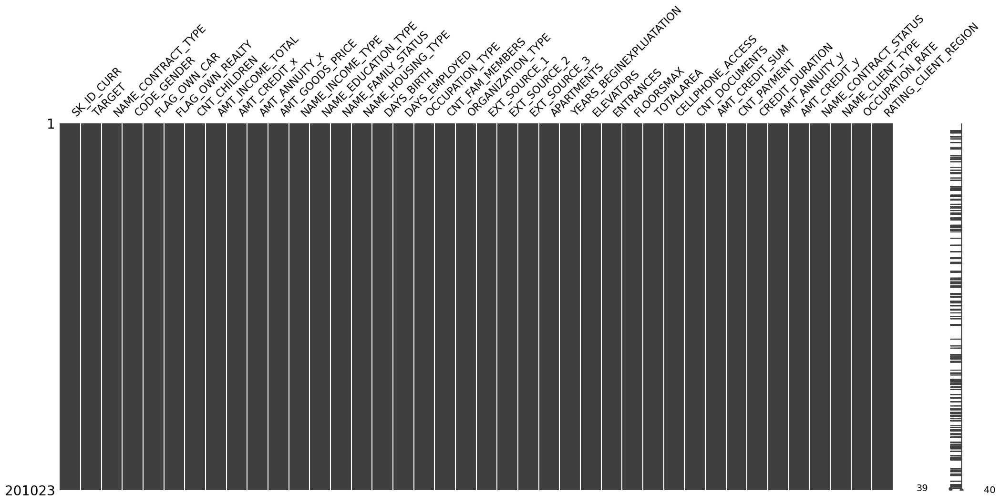

In [15]:
msno.matrix(data)

<AxesSubplot:>

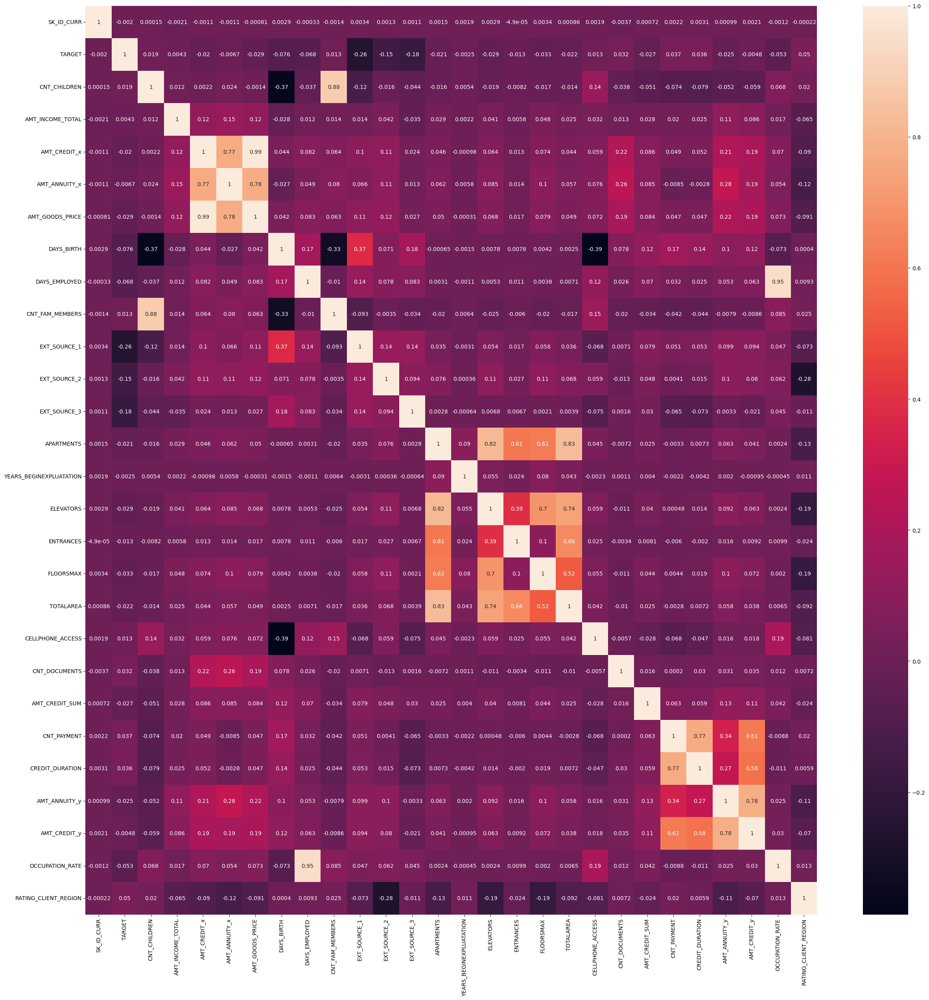

In [16]:
plt.figure(figsize=(30, 30))
sns.heatmap(data.corr(), annot=True)

#### occupons nous des outliers

In [17]:
num = data.select_dtypes(exclude='object')
list(num.columns)

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT_x',
 'AMT_ANNUITY_x',
 'AMT_GOODS_PRICE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS',
 'YEARS_BEGINEXPLUATATION',
 'ELEVATORS',
 'ENTRANCES',
 'FLOORSMAX',
 'TOTALAREA',
 'CELLPHONE_ACCESS',
 'CNT_DOCUMENTS',
 'AMT_CREDIT_SUM',
 'CNT_PAYMENT',
 'CREDIT_DURATION',
 'AMT_ANNUITY_y',
 'AMT_CREDIT_y',
 'OCCUPATION_RATE',
 'RATING_CLIENT_REGION']

In [18]:
print('nb outlier colonne : CNT_CHILDREN ',(data['CNT_CHILDREN']>7).sum())
print('nb outlier colonne : AMT_INCOME_TOTAL ',(data['AMT_INCOME_TOTAL']>1000000).sum())
print('nb outlier colonne : AMT_ANNUITY_x ',(data['AMT_ANNUITY_x']>150000).sum())
print('nb outlier colonne : AMT_CREDIT_x ',(data['AMT_CREDIT_x']>3000000).sum())
print('nb outlier colonne : AMT_GOODS_PRICE ',(data['AMT_GOODS_PRICE']>2500000).sum())
print('nb outlier colonne : CNT_FAM_MEMBERS ',(data['CNT_FAM_MEMBERS']>=15).sum())
print('nb outlier colonne : APARTMENTS ',(data['APARTMENTS']>=1).sum())
print('nb outlier colonne : YEARS_BEGINEXPLUATATION ',(data['YEARS_BEGINEXPLUATATION']<0.7).sum())
print('nb outlier colonne : ELEVATORS ',(data['ELEVATORS']>0.8).sum())
print('nb outlier colonne : ENTRANCES ',(data['ENTRANCES']>0.8).sum())
print('nb outlier colonne : FLOORSMAX ',(data['FLOORSMAX']>0.8).sum())
print('nb outlier colonne : TOTALAREA',(data['TOTALAREA']>3).sum())
print('nb outlier colonne : CNT_PAYMENT',(data['CNT_PAYMENT']>60).sum())
print('nb outlier colonne : CREDIT_DURATION',(data['CREDIT_DURATION']>80).sum())
print('nb outlier colonne : AMT_ANNUITY_y',(data['AMT_ANNUITY_y']>150000).sum())
print('nb outlier colonne : AMT_CREDIT_y',(data['AMT_CREDIT_y']>2000000).sum())

nb outlier colonne : CNT_CHILDREN  10
nb outlier colonne : AMT_INCOME_TOTAL  112
nb outlier colonne : AMT_ANNUITY_x  14
nb outlier colonne : AMT_CREDIT_x  6
nb outlier colonne : AMT_GOODS_PRICE  9
nb outlier colonne : CNT_FAM_MEMBERS  3
nb outlier colonne : APARTMENTS  78
nb outlier colonne : YEARS_BEGINEXPLUATATION  438
nb outlier colonne : ELEVATORS  273
nb outlier colonne : ENTRANCES  192
nb outlier colonne : FLOORSMAX  284
nb outlier colonne : TOTALAREA 7
nb outlier colonne : CNT_PAYMENT 7
nb outlier colonne : CREDIT_DURATION 5
nb outlier colonne : AMT_ANNUITY_y 3
nb outlier colonne : AMT_CREDIT_y 34


In [19]:
# data avant traitement des outliers
data.shape

(201023, 40)

In [20]:
data.drop(data[data['CNT_CHILDREN']>7].index,inplace=True)
data.drop(data[data['AMT_INCOME_TOTAL']>1000000].index,inplace=True)
data.drop(data[data['AMT_ANNUITY_x']>150000].index,inplace=True)
data.drop(data[data['AMT_CREDIT_x']>3000000].index,inplace=True)
data.drop(data[data['AMT_GOODS_PRICE']>2500000].index,inplace=True)
data.drop(data[data['CNT_FAM_MEMBERS']>=15].index,inplace=True)
data.drop(data[data['APARTMENTS']>=1].index,inplace=True)
data.drop(data[data['YEARS_BEGINEXPLUATATION']<0.7].index,inplace=True)
data.drop(data[data['ELEVATORS']>0.8].index,inplace=True)
data.drop(data[data['ENTRANCES']>0.8].index,inplace=True)
data.drop(data[data['FLOORSMAX']>0.8].index,inplace=True)
data.drop(data[data['TOTALAREA']>3].index,inplace=True)
data.drop(data[data['CNT_PAYMENT']>60].index,inplace=True)
data.drop(data[data['CREDIT_DURATION']>80].index,inplace=True)
data.drop(data[data['AMT_ANNUITY_y']>150000].index,inplace=True)
data.drop(data[data['AMT_CREDIT_y']>2000000].index,inplace=True)

In [21]:
# data après traitement des outliers
data.shape

(199679, 40)

<AxesSubplot:>

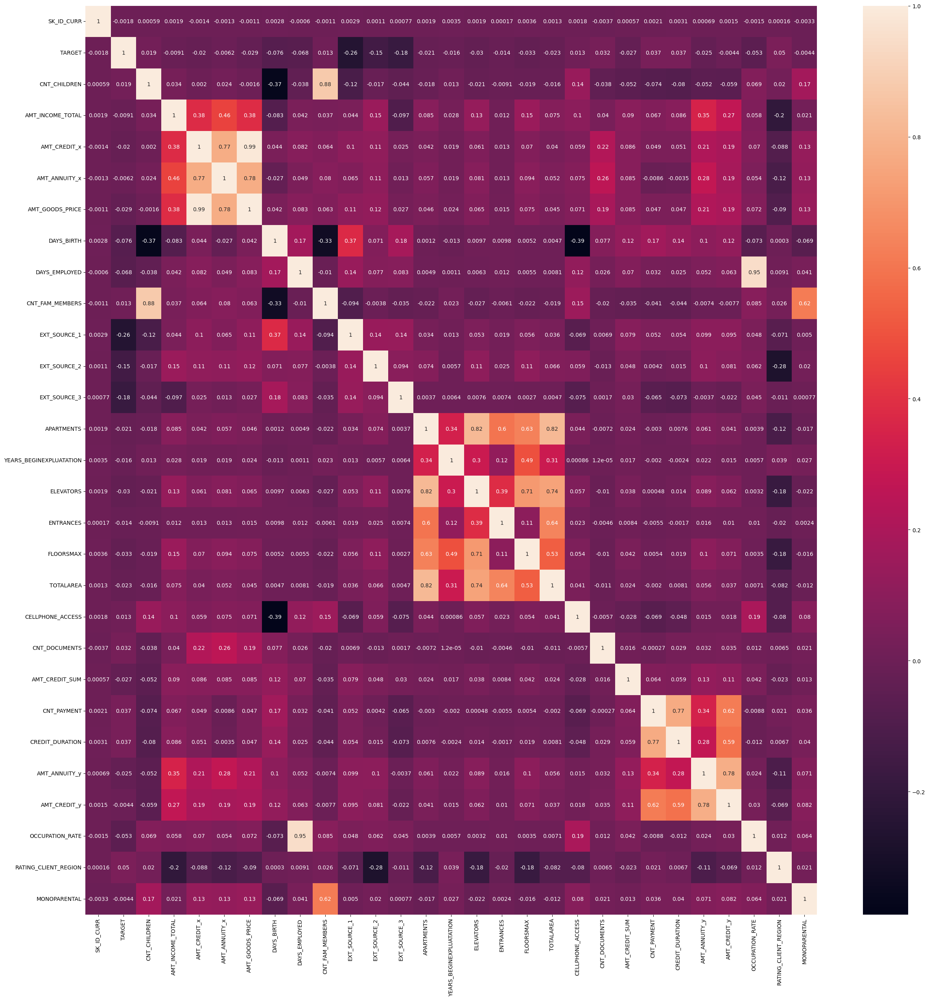

In [29]:
plt.figure(figsize=(30, 30))
sns.heatmap(data.corr(), annot=True)

In [24]:
data['MONOPARENTAL'] = data['CNT_FAM_MEMBERS'] - data['CNT_CHILDREN'] 

In [28]:
data['MONOPARENTAL'].nunique()

2

# preprocessing